# PDAC single ligand dataset validation analysis
#### _CK, BEM 2022_

### What this does:
- Loads in anndata from 1_preprocessing_anndata_with_cNMF_results.ipynb
- Runs PCA, harmony, UMAP for data visualization
- Runs Decoupler to score cells on PROGENy and MsigDB genesets
    - Correlates signature scores with cNMF module usage
- Loads in ligand effects from 2_ligand_effects_with_batch_regressed_out.ipynb and visualizes them

In [1]:
import os
import sys
import warnings
import random
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import anndata
import multiprocess as mp
from kneed import KneeLocator
from itertools import repeat
from scipy.stats import mode
from sklearn.metrics import silhouette_score
from sklearn.covariance import MinCovDet
from sklearn.preprocessing import RobustScaler
from statsmodels.stats.weightstats import ttest_ind
from statsmodels.stats.multitest import multipletests
from scipy.stats import pearsonr,spearmanr, mannwhitneyu
import decoupler as dc

pd.set_option('mode.chained_assignment', None)
warnings.simplefilter(action='ignore', category=FutureWarning)

sc.settings.verbosity = 2            # verbosity: errors (0), warnings (1), info (2), hints (3)

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
plt.rcParams["font.family"] = "Helvetica"

def cohen_d(x,y):
        return (np.mean(x) - np.mean(y)) / np.sqrt((np.std(x, ddof=1) ** 2 + np.std(y, ddof=1) ** 2) / 2.0)

/opt/miniconda3/envs/scanpy_env/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Define Functions

#### Hide annoying prints

In [2]:
class HiddenPrints:
    """
    Class to hide unnecessary prints
    """
    
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout

In [4]:
def module_robust_scaler(adata,mods_to_scale):
   
    # scale - center modules to control cells, and scale around all cells    
    
    center_to_media = RobustScaler(with_scaling=False,unit_variance=True)
    center_to_media.fit(adata.obs.loc[adata.obs.Control == "Control", adata.obs.columns.isin(mods_to_scale)].to_numpy())
    centered = center_to_media.transform(adata.obs.loc[:,adata.obs.columns.isin(mods_to_scale)].to_numpy())
    
    cols = list(adata.obs.columns[adata.obs.columns.isin(mods_to_scale)])
    
    scaler = RobustScaler(with_centering=False,unit_variance=True)
    modules_scaled = scaler.fit_transform(centered)
    modules_scaled = pd.DataFrame(modules_scaled, 
                          index = adata.obs.index, 
                          columns = cols)

    adata.obs.drop(mods_to_scale, axis=1, inplace=True)
    
    # Add to adata
    adata.obs = adata.obs.merge(modules_scaled, how='left', left_index=True, right_index=True)
        
    return(adata)

#### Annotation helper

In [5]:
def module_annotation_helper(adata, module_table, GEP_usage = False, scale_mods = False):
    
    # Add standard set of modules
    data_path = '../1_Data/'

    # Cell cycle
    G1s_genes = [x.strip() for x in open(data_path+'marker_genes/Tirosh2014_genes/G1_s.txt')]
    G2m_genes = [x.strip() for x in open(data_path+'marker_genes/Tirosh2014_genes/G2_m.txt')]
    adata = sc.tl.score_genes_cell_cycle(adata, s_genes=G1s_genes, g2m_genes=G2m_genes, copy = True, use_raw = False)

    # PDAC Basal / Classical
    mBasal = [x.strip() for x in open(data_path+'marker_genes/PDAC_ref_genes/Moffitt-basal25.txt')]
    adata = sc.tl.score_genes(adata, mBasal, score_name='mBasal', ctrl_size=len(mBasal), copy = True, use_raw = False)

    mClassical = [x.strip() for x in open(data_path+'marker_genes/PDAC_ref_genes/Moffitt-classical25.txt')]
    adata = sc.tl.score_genes(adata, mClassical, score_name='mClassical', ctrl_size=len(mClassical), copy = True, use_raw = False)

    scIT = [x.strip() for x in open(data_path+'marker_genes/PDAC_bioRxiv/scIT.txt')]
    adata = sc.tl.score_genes(adata, scIT, score_name='scIT', ctrl_size=len(scIT), copy = True, use_raw = False)

    scOS = [x.strip() for x in open(data_path+'marker_genes/PDAC_ref_genes/scOrg_Spec.txt')]
    adata = sc.tl.score_genes(adata, scOS, score_name='scOS', ctrl_size=len(scOS), copy = True, use_raw = False)
    
    adata.obs['mBC'] = adata.obs.mClassical - adata.obs.mBasal
    
    mods = ['mBasal','mClassical', 'mBC', 'scIT', 'scOS']
    
    
    # Add custom list of modules
    if GEP_usage == False:
        for mod in module_table.columns:
            
            # module score each gene set
            adata = sc.tl.score_genes(adata, module_table.loc[:,mod].dropna(),
                                      score_name=mod, ctrl_size=len(module_table.loc[:,mod]),
                                      copy = True, use_raw = False)
            
    else:
    
        # add usages
        module_table = module_table.add_prefix('GEP_')
        adata.obs = adata.obs.merge(module_table, how='left', left_index=True, right_index=True)
    
    # scale - center modules to control cells, and scale around all cells    
    if scale_mods == True:
        mods_to_scale = mods+list(module_table.columns.values)
        adata = module_robust_scaler(adata,mods_to_scale)
        
    return(adata)

In [6]:
# Find knee for PCA plot
def get_knee_PCA(adata, S):
    """
    module_usage: pd.Series
    """
    
    y = adata.uns['pca']['variance_ratio']
    x=range(1, len(y)+1)
    kn = KneeLocator(x, y, S=S, online=False, curve='convex', direction='decreasing')
    knee_val = kn.knee
        
    return(knee_val)

# Find genes > knee for DE genes
def get_knee_DE(adata, condition, S):
    """
    module_usage: pd.Series
    """
    
    y = adata.uns['rank_genes_groups']['scores'][condition]
    x=range(1, len(y)+1)
    kn = KneeLocator(x, y, S=S, online=False, curve='convex', direction='decreasing')
    knee_val = kn.knee

    top_genes = list(adata.uns['rank_genes_groups']['names'][condition][:knee_val])
        
    return(top_genes)

## Analysis

### Paths to files

In [16]:
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [7]:
h5ad_path = 'h5ad_files/'
combined_plates = h5ad_path + "valid_day7_concat_adata.h5ad"
path_to_cnmf = 'cnmf_output/valid_d7_concat/'

### Combined Plates

In [18]:
# Load combined validation
adata = sc.read(combined_plates)

# Obtain high variance genes that were used for cNMF as these were saved to a text file
hvgs = open(h5ad_path+'valid_day7_concat_hvg.txt').read().split('\n')

adata.var['highly_variable'] = adata.var.features.isin(hvgs)

# Save counts
adata.layers["raw"] = adata.X.copy()

# Pearson residual norm
sc.experimental.pp.normalize_pearson_residuals(adata)


computing analytic Pearson residuals on adata.X
    finished (0:00:05)


In [19]:
# load modules
valid_normd_usages = pd.read_csv("figures/k_26_valid_d7_concat_knee_2_normd_usages.csv", index_col=0)

# load top genes
valid_top_genes = pd.read_csv("figures/k_26_valid_d7_concat_knee_2_top_genes.csv")

# add GEPs
adata = module_annotation_helper(adata, module_table = valid_normd_usages, GEP_usage = True)

calculating cell cycle phase
computing score 'S_score'
    finished (0:00:01)
computing score 'G2M_score'
    finished (0:00:01)
computing score 'mBasal'
    finished (0:00:01)
computing score 'mClassical'
    finished (0:00:01)
computing score 'scIT'
    finished (0:00:01)
computing score 'scOS'
    finished (0:00:02)


In [20]:
# Change plate name
adata_concat = adata
del adata

## Merged plates

#### Determine num_PCs, harmony correct, neighbors, UMAP

In [21]:
# run PCA
sc.pp.pca(adata_concat, n_comps=100, use_highly_variable=True)

# run harmony
sc.external.pp.harmony_integrate(adata_concat, 'batch', max_iter_harmony = 25)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:08)


2022-09-28 11:04:43,191 - harmonypy - INFO - Iteration 1 of 25
2022-09-28 11:04:48,866 - harmonypy - INFO - Iteration 2 of 25
2022-09-28 11:04:55,332 - harmonypy - INFO - Converged after 2 iterations


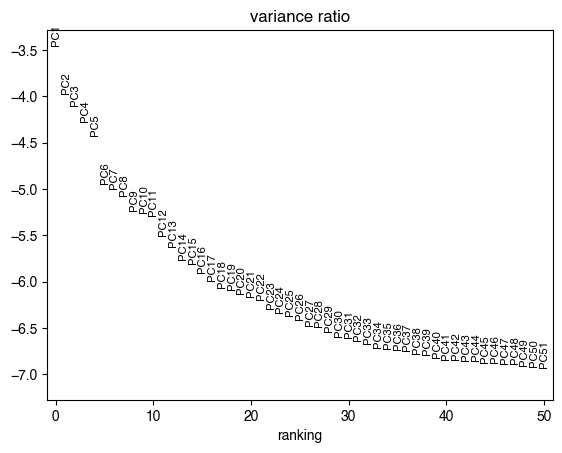

Knee of PCA at 14 PCs


In [22]:
# get num of PCs to use - by knee
sc.pl.pca_variance_ratio(adata_concat, n_pcs = 50, log=True)
num_pcs = get_knee_PCA(adata_concat, S=3)

print('Knee of PCA at '+str(num_pcs)+' PCs')

In [23]:
sc.pp.neighbors(adata_concat, n_neighbors=int(np.round(0.5*np.sqrt(np.shape(adata_concat.X)[0]))), 
                n_pcs=num_pcs, use_rep = 'X_pca_harmony')

sc.tl.umap(adata_concat)

computing neighbors
    finished (0:00:16)
computing UMAP
    finished (0:00:14)


### Look at structure

In [24]:
adata_concat.obs.batch.value_counts()

valid2    9891
plate2    2376
valid1    2284
plate1    1325
Name: batch, dtype: int64

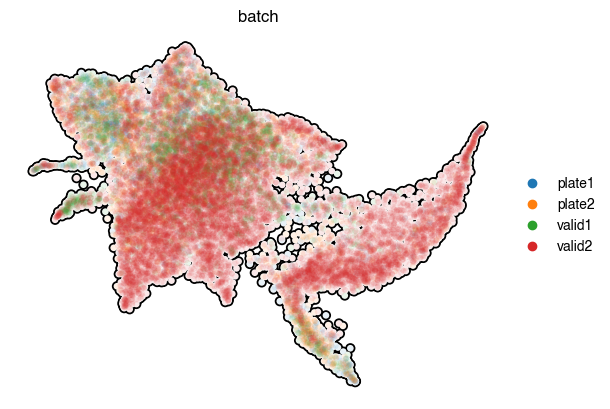

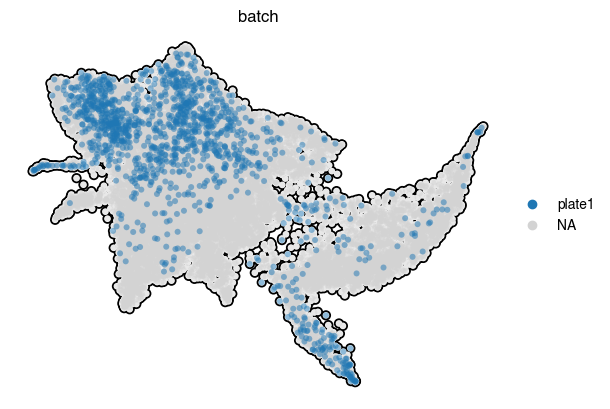

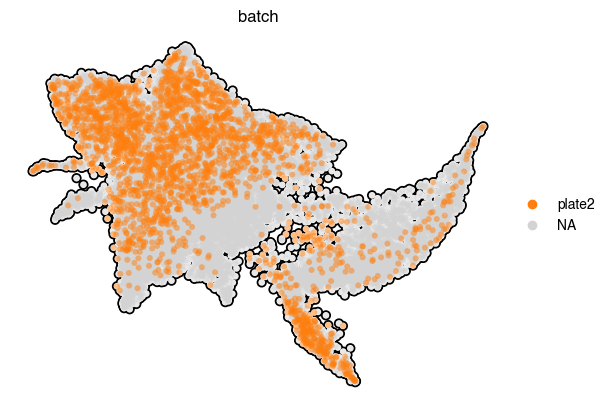

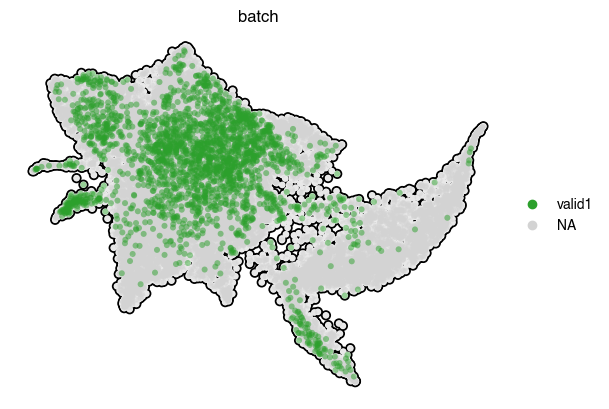

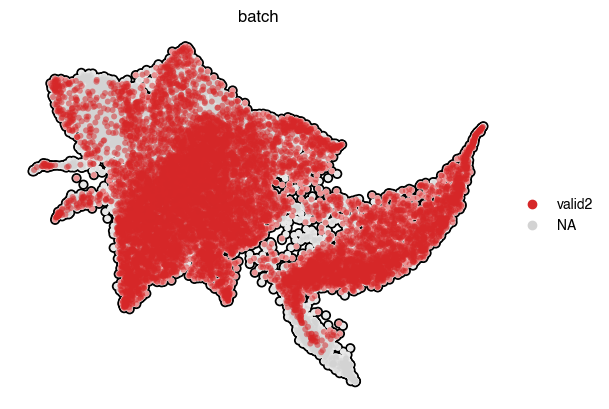

In [25]:
sc.pl.umap(adata_concat, color='batch', frameon=False, size=75, add_outline=True, alpha = 0.1,
           save = 'singleLigand_UMAP_batch.pdf')
sc.pl.umap(adata_concat, color='batch', groups='plate1', frameon=False, size=75, add_outline=True, alpha = 0.5,
           save = 'singleLigand_csp1_UMAP_batch.pdf')
sc.pl.umap(adata_concat, color='batch', groups='plate2', frameon=False, size=75, add_outline=True, alpha = 0.5,
           save = 'singleLigand_csp2_UMAP_batch.pdf')
sc.pl.umap(adata_concat, color='batch', groups='valid1', frameon=False, size=75, add_outline=True, alpha = 0.5,
           save = 'singleLigand_valid1_UMAP_batch.pdf')
sc.pl.umap(adata_concat, color='batch', groups='valid2', frameon=False, size=75, add_outline=True, alpha = 0.5,
           save = 'singleLigand_valid2_UMAP_batch.pdf')

In [26]:
sc.tl.embedding_density(adata_concat, basis='umap', groupby='Metadata_perturbation')

computing density on 'umap'


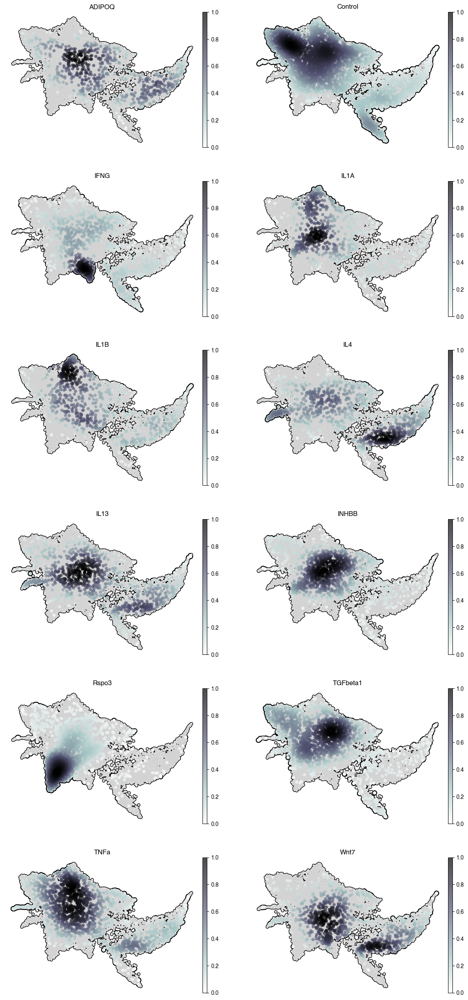

In [27]:
sc.pl.embedding_density(adata_concat, basis='umap', key='umap_density_Metadata_perturbation', ncols = 2, 
                        bg_dotsize = 50, fg_dotsize = 125, add_outline = True,
                        color_map = 'bone_r',frameon=False,
                        save = 'singleLigand_UMAP_by_perturbation_density.pdf')

ranking genes
    finished (0:03:51)


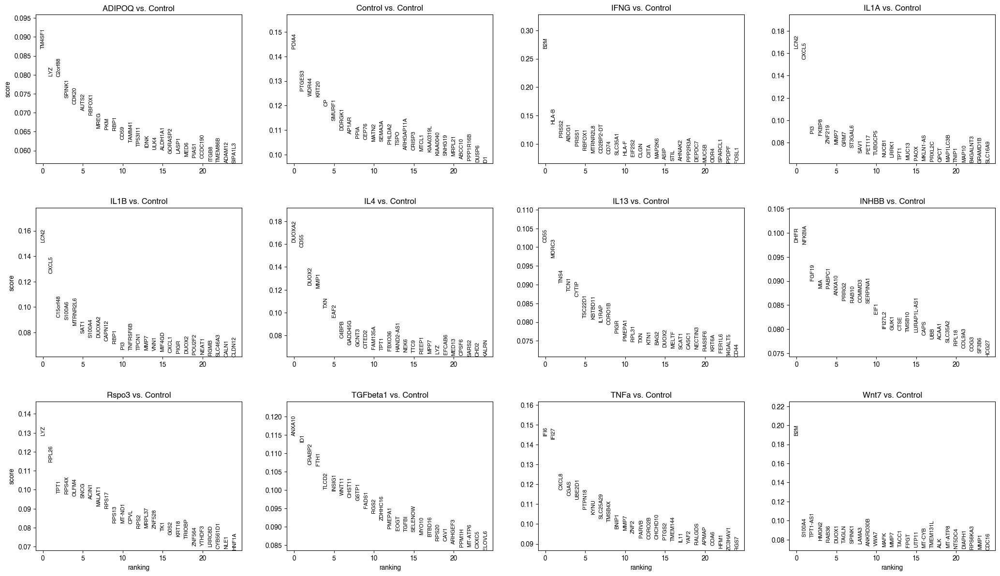

In [28]:
# get marker genes for landmarks
sc.tl.rank_genes_groups(adata_concat, groupby='Metadata_perturbation', reference='Control', 
                        method='logreg', use_raw=False, max_iter= 10000)
sc.pl.rank_genes_groups(adata_concat, n_genes=25, sharey=False)

In [22]:
adata_concat = sc.read("h5ad_files/singleLigand_plates_analyzed_day7_step1_9_28_2022.h5ad")

In [25]:
sc.pp.calculate_qc_metrics(adata_concat, qc_vars=('mito','ribo'), layer='raw', inplace=True)

KeyError: 'mito'

In [30]:
adata_concat.obs['pct_counts_mito'] = adata_concat.obs['percent.mt']
adata_concat.obs['log1p_total_counts'] = np.log1p(adata_concat.obs['nCount_RNA'])
adata_concat.obs['log1p_n_genes_by_counts'] = np.log1p(adata_concat.obs['nFeature_RNA'])

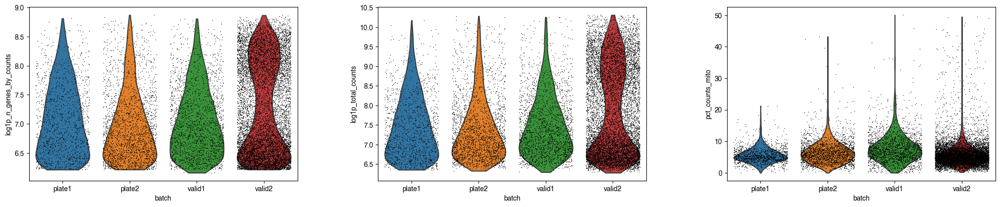

In [31]:
sc.pl.violin(adata_concat, groupby='batch', keys=['log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_mito'],
             jitter=0.4, multi_panel=True, save='QC_plots.pdf')

In [11]:
# sort GEPS by cov of variation for UMAPss, but don't filter on the validation data
GEP_table = adata_concat.obs.loc[:,adata_concat.obs.columns.str.startswith('GEP')].replace(0, np.nan)

coef_of_var = GEP_table.std()/GEP_table.mean()
std_order = list(coef_of_var.sort_values(ascending=False).index)

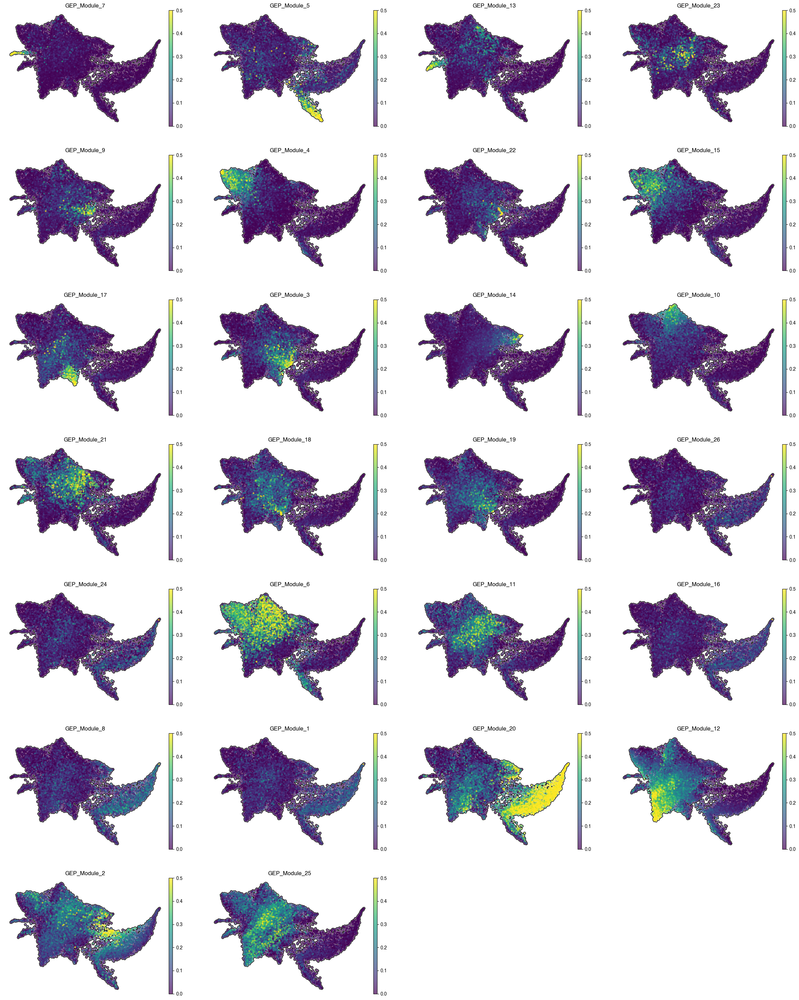

In [30]:
# Plot GEP activities
sc.pl.umap(adata_concat, color=std_order, add_outline=True,
           vmax=0.5, vmin=0, ncols = 4, frameon=False, size=50,
           save = 'singleLigand_UMAP_GEPs_by_coef_of_var.png')

### Annotate modules - Run PROGENy, MSIGdb Hallmarks

In [31]:
# progeny
model = dc.get_progeny(organism='human', top=100)
dc.run_consensus(mat=adata_concat, net=model, 
                 min_n=15,
                 source='source', target='target', weight='weight', 
                 verbose=True, use_raw=False)

Running consensus.
Running mlm on mat with 15876 samples and 12963 targets for 14 sources.


100%|█████████████████████████████████████████████| 2/2 [00:09<00:00,  4.86s/it]


Running ulm on mat with 15876 samples and 12963 targets for 14 sources.
Running wsum on mat with 15876 samples and 12963 targets for 14 sources.
Infering activities on 2 batches.


100%|█████████████████████████████████████████████| 2/2 [02:18<00:00, 69.30s/it]


In [32]:
# MsigDB hallmark enrichments
msigdb = dc.get_resource('MSigDB')

# Filter by hallmark
collections = ['hallmark']

msigdb = msigdb[msigdb.collection.isin(collections)]

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]

dc.run_ora(mat=adata_concat, net=msigdb,
           n_up=10, min_n=15,
           source='geneset', target='genesymbol',
           verbose=True, use_raw=False)

Running ora on mat with 15876 samples and 12963 targets for 50 sources.


100%|████████████████████████████████████| 15876/15876 [00:24<00:00, 656.47it/s]


In [12]:
# correlate modules with Progeny + Hallmark + Cell cycle & PDAC modules

# get list of things to correl
GEPs = GEP_table.columns.values
manual_mods = ['S_score','G2M_score',
               'percent.mt','percent.ribo',
               'nCount_RNA','nFeature_RNA',
               'mBasal','mClassical',
               'lm_IFNG_score','lm_TGFbeta1_score','lm_TNFa_score']

GEPs = adata_concat.obs.loc[:,adata_concat.obs.columns.isin(GEPs)]
manual_mods = adata_concat.obs.loc[:,adata_concat.obs.columns.isin(manual_mods)]
pathways = list(adata_concat.obsm['consensus_estimate'].columns)
genesets = list(adata_concat.obsm['ora_estimate'].columns)

combined_table = adata_concat.obsm['consensus_estimate'].merge(adata_concat.obsm['ora_estimate'], 
                                                         how='inner',left_index=True, right_index=True)
combined_table = GEPs.merge(combined_table, how='inner',left_index=True, right_index=True)
combined_table = manual_mods.merge(combined_table, how='inner',left_index=True, right_index=True)

# Create correl matricies
progeny_matrix = pd.DataFrame(np.zeros((len(GEPs.columns),len(pathways))),index=GEPs.columns,columns=pathways)
hallmark_matrix = pd.DataFrame(np.zeros((len(GEPs.columns),len(genesets))),index=GEPs.columns,columns=genesets)
mods_matrix = pd.DataFrame(np.zeros((len(GEPs.columns),len(manual_mods.columns))),index=GEPs.columns,columns=manual_mods.columns)

for GEP in GEPs.columns:
    corr_table = combined_table.loc[combined_table[GEP]>0,:]
    
    for pathway in pathways:
        # populate corr matrix
        corr = corr_table.loc[:,corr_table.columns.isin([GEP,pathway])].corr().iloc[0,1]
        progeny_matrix.loc[GEP,pathway] = corr

    for geneset in genesets:
        # populate corr matrix
        corr = corr_table.loc[:,corr_table.columns.isin([GEP,geneset])].corr().iloc[0,1]
        hallmark_matrix.loc[GEP,geneset] = corr
        
    for mod in manual_mods.columns:
        # populate corr matrix
        corr = corr_table.loc[:,corr_table.columns.isin([GEP,mod])].corr().iloc[0,1]
        mods_matrix.loc[GEP,mod] = corr
        
# Filter matricies
cor_cutoff = 0.15

# Select modules with peason r > cor_cutoff
keep_pathway = np.sum(abs(progeny_matrix) > cor_cutoff, axis=0) > 0
keep_geneset = np.sum(abs(hallmark_matrix) > cor_cutoff, axis=0) > 0
keep_mod = np.sum(abs(mods_matrix) > cor_cutoff, axis=0) > 0

filtered_progeny_matrix = progeny_matrix.loc[:, keep_pathway]
filtered_hallmark_matrix = hallmark_matrix.loc[:, keep_geneset]
filtered_mods_matrix = mods_matrix.loc[:, keep_mod]

filtered_matrix = pd.concat([filtered_progeny_matrix,filtered_hallmark_matrix,filtered_mods_matrix], axis=1)

In [34]:
adata_concat.write('h5ad_files/singleLigand_plates_analyzed_day7_step1_9_28_2022.h5ad')

In [27]:
# For now, not going to rename this stuff

# # Annotate modules!
# cs_module_naming = {'GEP_Module_1':"type I IFN",
#                     'GEP_Module_2':"ribosomal",
#                     'GEP_Module_3':"low complexity 2",
#                     'GEP_Module_4':"",
#                     'GEP_Module_5':"",
#                     'GEP_Module_6':"low complexity 1",
#                     'GEP_Module_7':"cell cycle S phaes",
#                     'GEP_Module_8:"NFKB',
#                     'GEP_Module_9':"",
#                     'GEP_Module_10':"",
#                     'GEP_Module_11':"classical",
#                     'GEP_Module_12':"",
#                     'GEP_Module_13':"IFNgamma",
#                     'GEP_Module_14':"wound healing",
#                     'GEP_Module_15':"",
#                     'GEP_Module_16':"",
#                     'GEP_Module_17':"cell cycle G2M",
#                     'GEP_Module_18':"",
#                     'GEP_Module_19':"",
#                     'GEP_Module_20':"TGFbeta",
#                     'GEP_Module_21':"",
#                     'GEP_Module_22':"",
#                     'GEP_Module_23':"",
#                     'GEP_Module_24':"",
#                     'GEP_Module_25':"",
#                     'GEP_Module_26':"",
#                     'GEP_Module_27':"",
#                     'GEP_Module_28':""}
# # cs_module_naming = {
# #                     'GEP_Module_10':"mitochondrial",
# #                     'GEP_Module_21':"",
# #                     'GEP_Module_24':"",
# #                     'GEP_Module_25':"",
# #                     'GEP_Module_26':"classical"}

# # Rename in adata
# adata_concat.obs = adata_concat.obs.rename(columns=cs_module_naming)

# # Rename in corr_matrix
# filtered_matrix = filtered_matrix.rename(index=cs_module_naming)

# # save adata
# adata_concat.write('h5ad_files/combined_plates_analyzed_step1_9_19_2022.h5ad')

In [8]:
adata_concat = sc.read("h5ad_files/singleLigand_plates_analyzed_day7_step1_9_28_2022.h5ad")

In [10]:
adata_concat.obs.columns

Index(['nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo',
       'sample_well', 'Metadata_perturbation', 'batch', 'time', 'S_score',
       'G2M_score', 'phase', 'mBasal', 'mClassical', 'scIT', 'scOS', 'mBC',
       'GEP_Module_1', 'GEP_Module_2', 'GEP_Module_3', 'GEP_Module_4',
       'GEP_Module_5', 'GEP_Module_6', 'GEP_Module_7', 'GEP_Module_8',
       'GEP_Module_9', 'GEP_Module_10', 'GEP_Module_11', 'GEP_Module_12',
       'GEP_Module_13', 'GEP_Module_14', 'GEP_Module_15', 'GEP_Module_16',
       'GEP_Module_17', 'GEP_Module_18', 'GEP_Module_19', 'GEP_Module_20',
       'GEP_Module_21', 'GEP_Module_22', 'GEP_Module_23', 'GEP_Module_24',
       'GEP_Module_25', 'GEP_Module_26', 'umap_density_Metadata_perturbation'],
      dtype='object')

In [15]:
controls = adata_concat[adata_concat.obs.Metadata_perturbation=="Control",:]

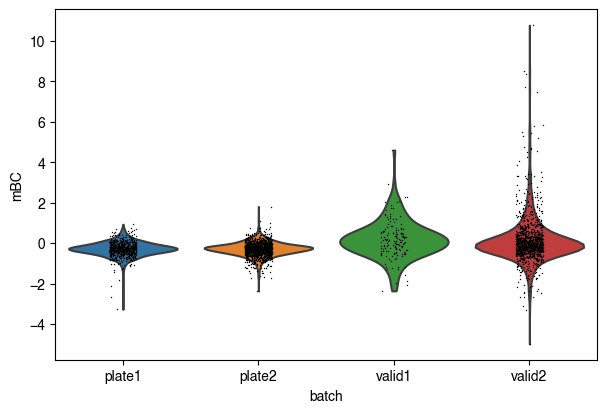

In [21]:
sc.pl.violin(controls,'mBC',groupby='batch',save="neg_control_mBC.pdf")

In [46]:
filtered_matrix.loc["GEP_Module_11"].sort_values(ascending=False).iloc[0:10]

nFeature_RNA                 0.129958
nCount_RNA                   0.121737
percent.mt                   0.095863
VEGF                         0.088547
p53                          0.068467
HALLMARK_ANGIOGENESIS        0.066846
HALLMARK_MTORC1_SIGNALING    0.058644
mClassical                   0.053419
JAK-STAT                     0.051178
Hypoxia                      0.038598
Name: GEP_Module_11, dtype: float64

In [45]:
filtered_matrix.loc["GEP_Module_6"].sort_values(ascending=False).iloc[0:10]

NFkB                              0.367141
TNFa                              0.265257
S_score                           0.259907
MAPK                              0.257539
G2M_score                         0.219869
PI3K                              0.193551
EGFR                              0.168500
JAK-STAT                          0.130547
HALLMARK_INFLAMMATORY_RESPONSE    0.084855
HALLMARK_G2M_CHECKPOINT           0.071531
Name: GEP_Module_6, dtype: float64

In [43]:
filtered_matrix["mClassical"].sort_values(ascending=False).iloc[0:10]

GEP_Module_18    0.688639
GEP_Module_3     0.232408
GEP_Module_19    0.174090
GEP_Module_13    0.143050
GEP_Module_9     0.124594
GEP_Module_22    0.105211
GEP_Module_21    0.098985
GEP_Module_11    0.053419
GEP_Module_10    0.039713
GEP_Module_12    0.000745
Name: mClassical, dtype: float64

#### Defining the modules that are highly correlated with CS

In [13]:
# highly correlated moduless with CS
high_corr_module_naming = {
                    'GEP_Module_2':"low complexity 3",
                    'GEP_Module_4':"cell cycle G2M",
                    'GEP_Module_5':"low complexity 1",
                    # 'GEP_Module_6':"PDAC-related 1",
                    'GEP_Module_7':"type I IFN",
                    'GEP_Module_10':"NFKB",
                    # 'GEP_Module_11':"PDAC-related 2",
                    'GEP_Module_12':"ribosomal",
                    'GEP_Module_13':"wound healing",       
                    'GEP_Module_14':"mitochondrial",
                    'GEP_Module_15':"cell cycle S phase",
                    'GEP_Module_17':"IFNgamma",
                    'GEP_Module_18':"classical",
                    # 'GEP_Module_19':"PDAC-related 3",
                    'GEP_Module_20':"low complexity 2",
                    'GEP_Module_23':"TGFbeta"
                    # 'GEP_Module_25':"PDAC-related 4"
}



high_corr_filtered_matrix = filtered_matrix.loc[list(high_corr_module_naming.keys())]
high_corr_filtered_matrix = high_corr_filtered_matrix.rename(index=high_corr_module_naming)



In [200]:
# Module 5: Pancreatitis / fibrosis like
    # HLA-DRA, CD74
# Module 12: high in MAML2, FTX, DLEU1. From a quick google, all seem to be associated with pancreatic
    # cancer and/or pancreatic cell proliferations

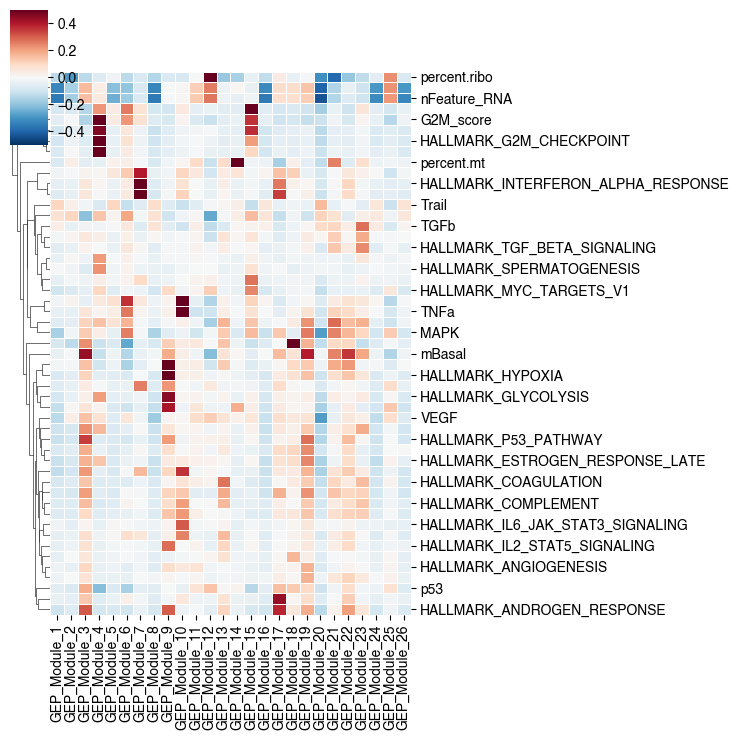

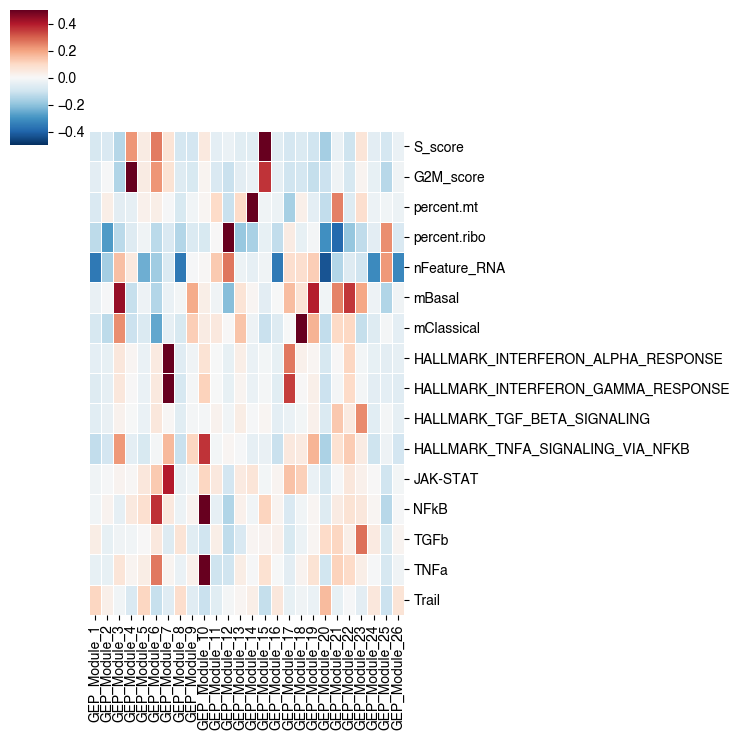

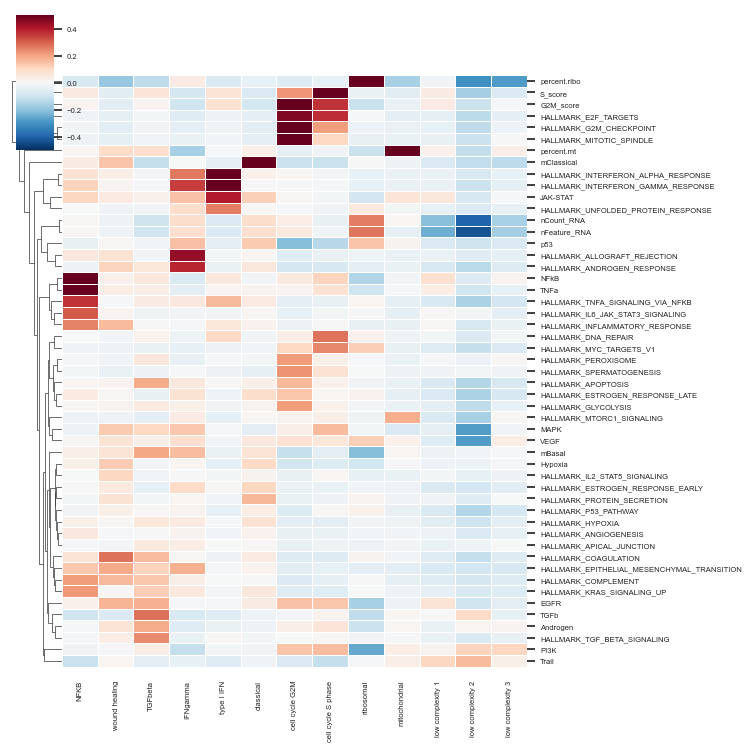

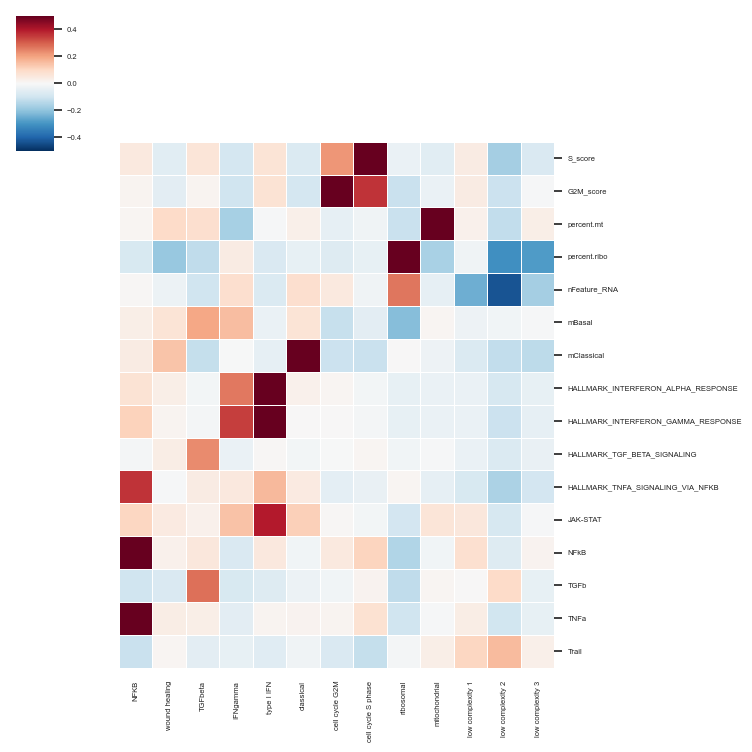

In [14]:
# make final plots
new_mod_order = ["NFKB",
                 "wound healing",
                 "TGFbeta",
                 "IFNgamma",
                 "type I IFN",
                 "classical",
                 "cell cycle G2M",
                 "cell cycle S phase",
                 "ribosomal",
                 "mitochondrial",
                 "low complexity 1",
                 "low complexity 2",
                 "low complexity 3"]
                #  "PDAC-related 1",
                # "PDAC-related 2",
                # "PDAC-related 3",
                # "PDAC-related 4"]

selected_pathways = ['S_score',
                     'G2M_score',
                     'percent.mt',
                     'percent.ribo',
                     'nFeature_RNA',
                     'mBasal',
                     'mClassical',
                     'HALLMARK_INTERFERON_ALPHA_RESPONSE',
                     'HALLMARK_INTERFERON_GAMMA_RESPONSE',
                     'HALLMARK_TGF_BETA_SIGNALING',
                     'HALLMARK_TNFA_SIGNALING_VIA_NFKB',
                     'JAK-STAT',
                     'NFkB', 
                     'TGFb', 
                     'TNFa', 
                     'Trail']

# Plotting for all validation modules
fig = sns.clustermap(filtered_matrix.T, cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize = (7.5,7.5),
                     method = 'weighted', dendrogram_ratio = 0.1, colors_ratio = 0.1, linewidths=.5,
                     col_cluster=False)
fig.savefig('figures/GEP_corr_pathways.pdf');

fig = sns.clustermap(filtered_matrix[selected_pathways].T, cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize = (7.5,7.5),
                     colors_ratio = 0.1, linewidths=.5,
                     col_cluster=False, row_cluster=False)
fig.savefig('figures/GEP_corr_select_pathways.pdf');


# Plotting only for the modules that are highly corrleated with the CS modules
high_corr_filtered_matrix = high_corr_filtered_matrix.reindex(index = new_mod_order)
sns.set(font_scale=0.5)
fig = sns.clustermap(high_corr_filtered_matrix.T, cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize = (7.5,7.5),
                     method = 'weighted', dendrogram_ratio = 0.1, colors_ratio = 0.1, linewidths=.5,
                     col_cluster=False)
fig.savefig('figures/GEP_corr_pathways_val_modules_corr_with_cs.pdf');

fig = sns.clustermap(high_corr_filtered_matrix[selected_pathways].T, cmap="RdBu_r", vmin=-0.5, vmax=0.5, figsize = (7.5,7.5),
                     colors_ratio = 0.1, linewidths=.5,
                     col_cluster=False, row_cluster=False)
fig.savefig('figures/GEP_corr_select_pathways_val_modules_corr_with_cs.pdf');






In [15]:
# Load in the cNMF results

gene_scores = pd.read_csv('figures/k_26_valid_d7_concat_knee_2_gene_scores.csv', index_col=0).add_prefix('GEP_')
normd_usages = pd.read_csv('figures/k_26_valid_d7_concat_knee_2_normd_usages.csv', index_col=0).add_prefix('GEP_')
top_genes = pd.read_csv('figures/k_26_valid_d7_concat_knee_2_top_genes.csv').add_prefix('GEP_')

In [16]:
# make heatmap of top usages

# gene_scores = gene_scores.reindex(columns = new_mod_order)
# top_genes = top_genes.reindex(columns = new_mod_order)

# get top 3 genes for each module
top_3_genes = []
for i in list(range(len(top_genes.columns))):
    top_3_genes.extend(top_genes.iloc[:3,i].values.tolist())
    
# filter gene scores
plot_gene_scores = gene_scores.loc[gene_scores.index.isin(top_3_genes),:]
plot_gene_scores = plot_gene_scores.reindex(index = top_3_genes)

gene_scores_high_corr = gene_scores[list(high_corr_module_naming.keys())]
gene_scores_high_corr.columns = [high_corr_module_naming[x] for x in high_corr_module_naming]
gene_scores_high_corr = gene_scores_high_corr[new_mod_order]

top_genes_high_corr = top_genes[list(high_corr_module_naming.keys())]
top_genes_high_corr.columns = [high_corr_module_naming[x] for x in high_corr_module_naming]
top_genes_high_corr = top_genes_high_corr[new_mod_order]

top_3_genes = []
for i in list(range(len(top_genes_high_corr.columns))):
    top_3_genes.extend(top_genes_high_corr.iloc[:3,i].values.tolist())
    
# filter gene scores
plot_gene_scores_high_corr = gene_scores_high_corr.loc[gene_scores_high_corr.index.isin(top_3_genes),:]
plot_gene_scores_high_corr = plot_gene_scores_high_corr.reindex(index = top_3_genes)

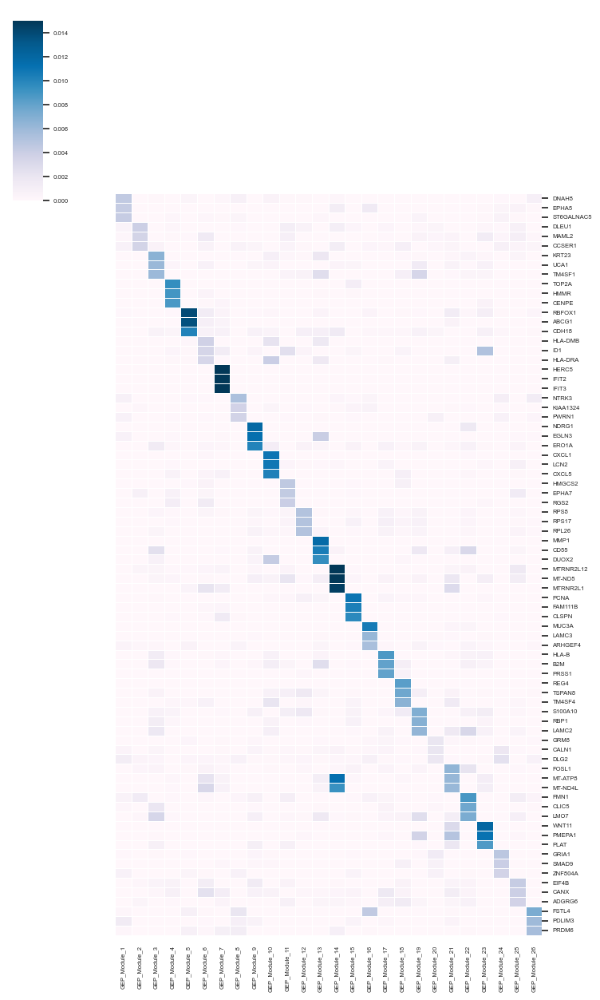

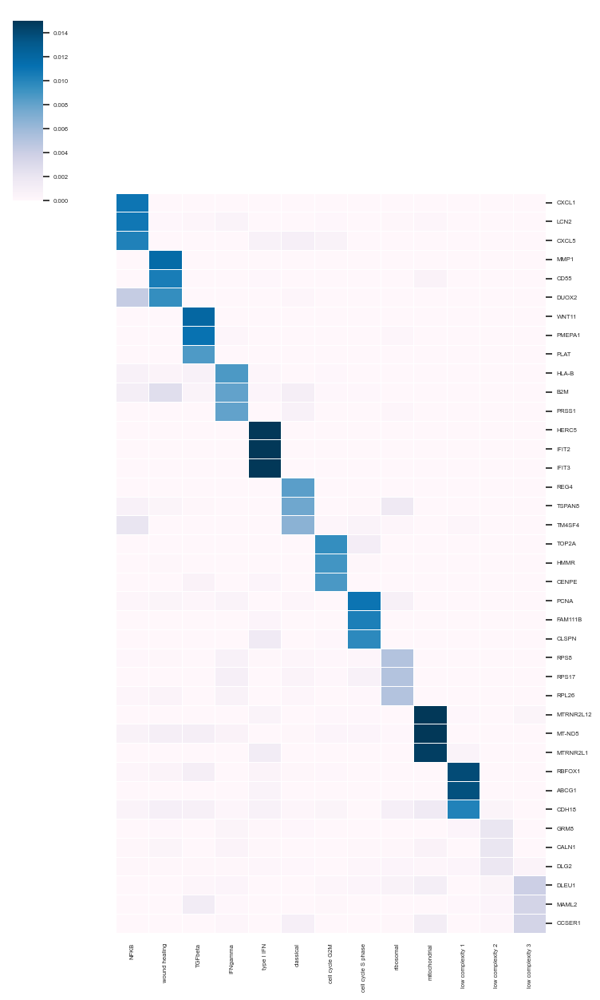

In [17]:
# Plot the top genes for all single ligand cNMF modules
fig = sns.clustermap(plot_gene_scores, cmap="PuBu", vmin=0, vmax=0.015, linewidths=.5, figsize = (7.5,12.5),
                     colors_ratio = 0.1, col_cluster=False, row_cluster=False)
fig.savefig('figures/GEP_gene_spectra_top_genes.pdf');

# Plot the top genes for only the single lignad modules that are highly correlated with compressed
fig = sns.clustermap(plot_gene_scores_high_corr, cmap="PuBu", vmin=0, vmax=0.015, linewidths=.5, figsize = (7.5,12.5),
                     colors_ratio = 0.1, col_cluster=False, row_cluster=False)
fig.savefig('figures/GEP_gene_spectra_top_genes_val_modules_corr_with_cs.pdf');


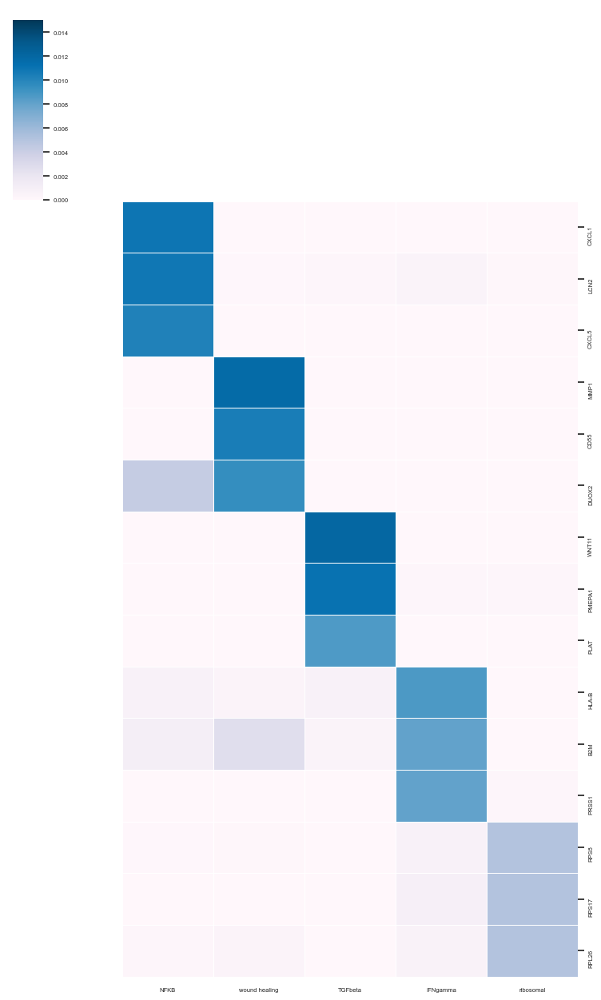

In [18]:
ligand_order = ["IL1A","IL1B","TNFa",
                "IL4","IL13","ADIPOQ",
                "TGFbeta1","INHBB",
                "IFNG",
                "Rspo3","Wnt7"]
few_pathways = ['NFKB','wound healing','TGFbeta','IFNgamma','ribosomal']


# Plot the top genes for only the single lignad modules that are highly correlated with compressed
fig = sns.clustermap(pd.concat([plot_gene_scores_high_corr.loc[:,few_pathways].iloc[0:12],
          plot_gene_scores_high_corr.loc[:,few_pathways].iloc[24:27]]), cmap="PuBu", vmin=0, vmax=0.015, linewidths=.5, figsize = (7.5,12.5),
                     colors_ratio = 0.1, col_cluster=False, row_cluster=False)
fig.savefig('figures/GEP_gene_spectra_top_genes_val_modules_corr_with_cs_few.pdf');

In [19]:
adata_concat.obs['sample'] = adata_concat.obs["Metadata_perturbation"].astype(str)
adata_concat.obs['day'].loc[adata_concat.obs['day']=='plate1'] = 'cs'
adata_concat.obs['day'].loc[adata_concat.obs['day']=='plate2'] = 'cs'
adata_concat.obs.to_csv("../../../CK/pdac_Nov2021_screen_analysis/fall2022_analysis/validation_with_reseq/single_ligand_meta_and_cNMF_usages_k26.csv")

KeyError: 'day'

# Day 7 effects with batch regressed out

In [66]:
# Regressioin ran in R in ligand_effects_with_batch_regressed_out.ipynb

In [20]:
reg_result_path = "/Users/connerkummerlowe/Dropbox (MIT)/lets_do_drugs/CK/pdac_Nov2021_screen_analysis/fall2022_analysis/validation_with_reseq/"

In [21]:
k = "26"
timepoint="7"
day7_effects = pd.read_csv(reg_result_path+"cnmf_linear_model_coeficients_d"+timepoint+"_k"+k+".csv",index_col=1).iloc[:,1:]
single_ligand_perturbs = ['ADIPOQ', 'IFNG', 'IL13', 'IL1A', 'IL1B', 'IL4',
       'INHBB', 'Rspo3', 'TGFbeta1', 'TNFa', 'Wnt7']
ligands_day7_effects = day7_effects.loc[single_ligand_perturbs]

In [22]:
ligands_day7_effects

,GEP_Module_1,GEP_Module_2,GEP_Module_3,GEP_Module_4,GEP_Module_5,GEP_Module_6,GEP_Module_7,GEP_Module_8,GEP_Module_9,GEP_Module_10,...,GEP_Module_17,GEP_Module_18,GEP_Module_19,GEP_Module_20,GEP_Module_21,GEP_Module_22,GEP_Module_23,GEP_Module_24,GEP_Module_25,GEP_Module_26
ligand,,,,,,,,,,,,,,,,,,,,,
ADIPOQ,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.011830,0.000000,...,0.000000,0.000000,0.000000,0.038906,0.000000,0.000000,0.000000,0.0,0.000000,0.0
IFNG,0.000000,0.0,0.000000,-0.023144,0.011689,-0.022756,0.000000,0.000000,-0.008966,0.000000,...,0.093682,-0.013015,0.000000,0.000000,0.000000,0.017119,0.000000,0.0,0.000000,0.0
IL13,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.008996,0.000000,0.000000,...,-0.009417,-0.022226,-0.011102,0.030534,0.000000,0.000000,0.011998,0.0,0.000000,0.0
IL1A,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,-0.008636,0.000000,0.051325,...,0.000000,0.000000,0.000000,-0.050277,0.000000,0.000000,0.000000,0.0,0.043730,0.0
IL1B,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.069330,...,0.000000,0.000000,0.018607,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0
IL4,0.011225,0.0,0.000000,-0.012701,0.000000,0.000000,0.000000,0.012214,-0.009621,0.000000,...,0.000000,-0.015205,-0.019934,0.081708,0.000000,-0.007067,0.000000,0.0,0.000000,0.0
INHBB,-0.008977,0.0,-0.011746,0.000000,0.000000,0.000000,0.005334,-0.008476,0.000000,0.007430,...,0.000000,0.000000,0.013713,-0.057865,0.011931,0.000000,0.000000,0.0,0.061308,0.0
Rspo3,-0.008518,0.0,-0.033527,-0.012470,-0.011475,0.000000,0.000000,-0.011879,-0.015810,0.000000,...,0.015471,-0.023290,-0.014607,-0.069033,0.000000,-0.011773,0.000000,0.0,0.124936,0.0
TGFbeta1,-0.005806,0.0,-0.016399,0.000000,0.000000,-0.014735,0.000000,-0.006242,0.000000,-0.007040,...,0.000000,-0.016315,0.000000,-0.033211,0.000000,0.000000,0.051097,0.0,0.012702,0.0


In [23]:
hits = anndata.AnnData(ligands_day7_effects)

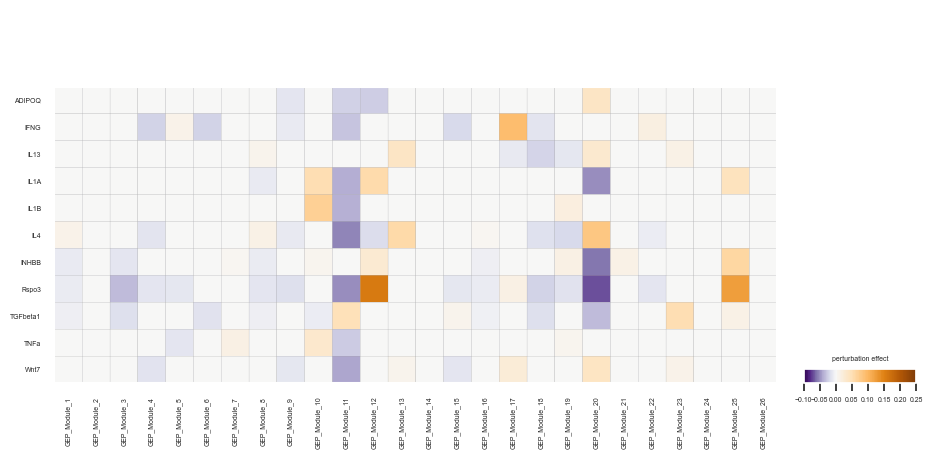

In [24]:
sc.pl.matrixplot(hits, ligands_day7_effects.columns.values, groupby="ligand",
                 colorbar_title='perturbation effect', vmin=-0.1, vmax=0.25, vcenter=0, 
                 cmap='PuOr_r', 
                 save='valid_effects_adj_p_0_05.pdf')

In [25]:
old_names = [x for x in high_corr_module_naming]
new_names = [high_corr_module_naming[x] for x in high_corr_module_naming]

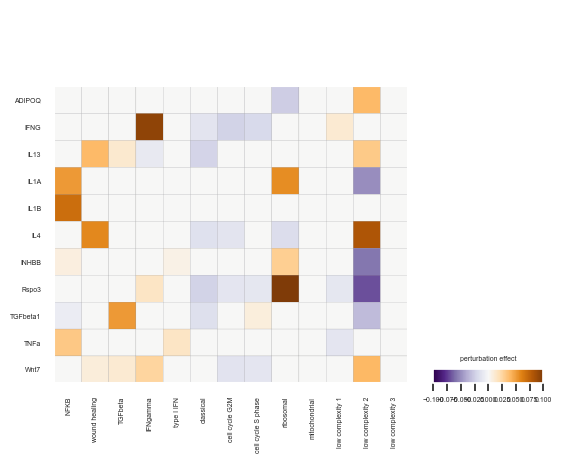

In [28]:
filt_day7_effects = ligands_day7_effects.loc[:,old_names]
filt_day7_effects.columns = new_names
filt_hits = anndata.AnnData(filt_day7_effects.loc[:,new_mod_order])
sc.pl.matrixplot(filt_hits, new_mod_order, groupby="ligand",
                 colorbar_title='perturbation effect', vmin=-0.1, vmax=0.1, vcenter=0, 
                 cmap='PuOr_r', 
                 save='valid_effects_corr_modules_adj_p_0_05.pdf')


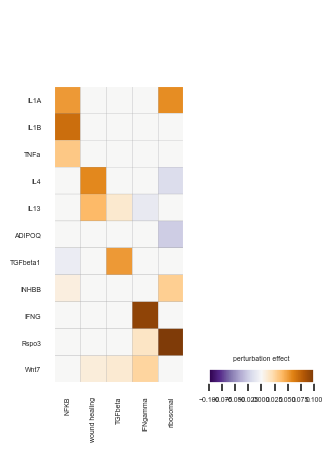

In [29]:
ligand_order = ["IL1A","IL1B","TNFa",
                "IL4","IL13","ADIPOQ",
                "TGFbeta1","INHBB",
                "IFNG",
                "Rspo3","Wnt7"]
few_pathways = ['NFKB','wound healing','TGFbeta','IFNgamma','ribosomal']
filt_hits = anndata.AnnData(filt_day7_effects.loc[ligand_order,few_pathways])
filt_hits.obs.index = filt_hits.obs.index.astype("category")
filt_hits.obs.index = filt_hits.obs.index.reorder_categories(ligand_order)
sc.pl.matrixplot(filt_hits, few_pathways, groupby="ligand",
                 colorbar_title='perturbation effect', vmin=-0.1, vmax=0.1, vcenter=0, 
                 cmap='PuOr_r', 
                 save='few_valid_effects_corr_modules_adj_p_0_05.pdf')



In [30]:
filt_hits.obs.index

CategoricalIndex(['IL1A', 'IL1B', 'TNFa', 'IL4', 'IL13', 'ADIPOQ', 'TGFbeta1',
                  'INHBB', 'IFNG', 'Rspo3', 'Wnt7'],
                 categories=['ADIPOQ', 'IFNG', 'IL13', 'IL1A', 'IL1B', 'IL4', 'INHBB', 'Rspo3', ...], ordered=False, dtype='category', name='ligand')

# Plotting mBC score by batch

In [40]:
adata_concat.obs['mBC']= adata_concat.obs.mClassical - adata_concat.obs.mBasal

In [44]:
controls = adata_concat[adata_concat.obs.Metadata_perturbation=="Control",:]

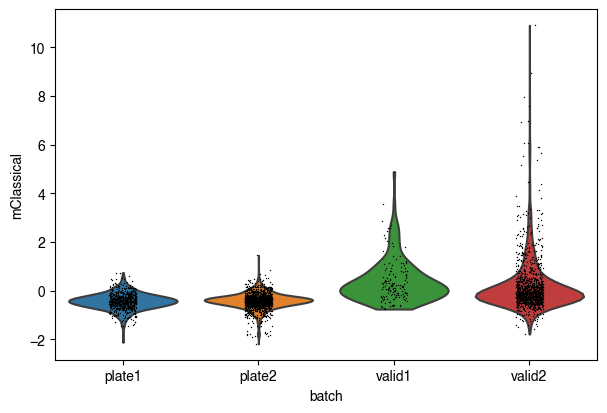

In [47]:
sc.pl.violin(controls,'mClassical',groupby="batch")

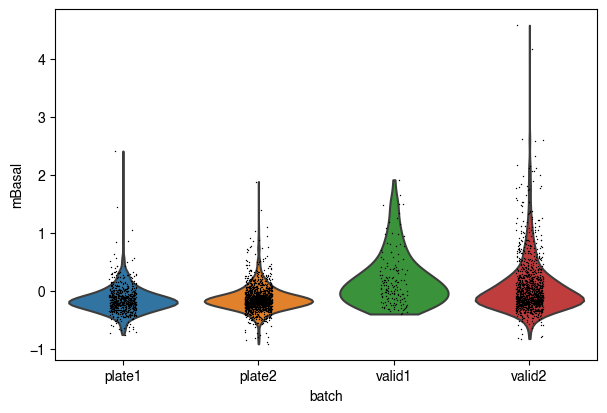

In [48]:
sc.pl.violin(controls,'mBasal',groupby="batch")

In [39]:
adata_concat.obs.columns

Index(['nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo',
       'sample_well', 'Metadata_perturbation', 'batch', 'time', 'S_score',
       'G2M_score', 'phase', 'mBasal', 'mClassical', 'scIT', 'scOS', 'mBC',
       'GEP_Module_1', 'GEP_Module_2', 'GEP_Module_3', 'GEP_Module_4',
       'GEP_Module_5', 'GEP_Module_6', 'GEP_Module_7', 'GEP_Module_8',
       'GEP_Module_9', 'GEP_Module_10', 'GEP_Module_11', 'GEP_Module_12',
       'GEP_Module_13', 'GEP_Module_14', 'GEP_Module_15', 'GEP_Module_16',
       'GEP_Module_17', 'GEP_Module_18', 'GEP_Module_19', 'GEP_Module_20',
       'GEP_Module_21', 'GEP_Module_22', 'GEP_Module_23', 'GEP_Module_24',
       'GEP_Module_25', 'GEP_Module_26', 'umap_density_Metadata_perturbation'],
      dtype='object')